NAMA : DANIEL ADITYA WARIH

LINK DATASETS : https://www.kaggle.com/jsphyg/weather-dataset-rattle-package





In [ ]:
from google.colab import files
files.upload()


Saving archive_16.zip to archive_16 (1).zip


{'archive_16.zip': b'PK\x03\x04-\x00\x00\x00\x08\x00HS\x8bQ\x18)W\xe7\xff\xff\xff\xff\xff\xff\xff\xff\x0e\x00\x14\x00weatherAUS.csv\x01\x00\x10\x00\xe7\x0e\xd7\x00\x00\x00\x00\x00\x90Y=\x00\x00\x00\x00\x00\xac\xbd[\x8f5\xb9r%\xf6\xee\xdf\x92\xa7\x90\xbc%\xc9\xc7\x0f\x9e\x82\xfd\xe0I\x18\xde\x03\x14\xfcx\xec\x91a\x01\x92\x8e\xa0\x8b\xed\xf9\xf7\xceX+\x82\x0c2k\x060`\xa8u\xfa\xeb\xee\xaa\xd8\xdcd\\V\xdc\xff\xc3_\xff\xed\xef\x8e\xff\xe9o\xff\xfb_\xff\xed\xef\xff\xf6O\xc7\x7f\xfc\xfb\x7f\xfaO\x7f\xf7\x8f\xff|\xfc\xc7\xbf\xfe?\xf8\xfb\xff\xf2\xd7\xbf\xff\xa7\xff\xe3\xaf\xff\xf0\x0f\xc7\xf7\xff\xf5\xd7\x7f\xfe\xdb\xbf\xf0\x87>\xff\xfeO\xff\xfa\x7f\xfe\xfd?\xfd\xdd\xf1\xf3\xf7\xff\xf4\x9f\xff\x87\x7f\xff\xd7\x7f\xfb\x0f\x7f\xff/\xe3\xcf\x9f\x7f\xfe\xbb\xbf\xfb\xcf\xf8\xa7\xe7\xdf\xf6\xbf\xfe\xa3\xfd1\xfd3\xff\x88\xffn\xff\x1e\xff \xff\xe5\x7f\xfc\xf7\x7f\xfc\xfb\xff\xfc\xf7\xff\xf6_\xe4?\xd8\x9f\xe5\xdf\xff\xcf\xff\xf2w\xff\xfa\xaf\xff\xfe/\x7f\'\xff\xde\xfe,\xff\xfe\xbf\xff\x87\xbf\xfd;\xa8\

In [ ]:
import os
import zipfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from keras.layers import Dense, LSTM
from sklearn.model_selection import train_test_split

#mengekstrak file
local_zip = '/content/archive_16 (1).zip'
zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close()
os.listdir('/tmp/')

['dap_multiplexer.688fd547052a.root.log.INFO.20210824-151210.55',
 'tmpwye6n9eb.py',
 'tmpsjci28h1.py',
 'tmpeyvanb5h.py',
 'debugger_fjgswq8zy',
 'tmpb4ryqyh_.py',
 'dap_multiplexer.INFO',
 'initgoogle_syslog_dir.0',
 'weatherAUS.csv',
 '__pycache__']

In [ ]:
raw_df = pd.read_csv('/tmp/weatherAUS.csv')
raw_df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
145455,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,ENE,13.0,11.0,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
145456,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,N,13.0,9.0,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
145457,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,WNW,9.0,9.0,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
145458,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,N,13.0,7.0,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
145459,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,ESE,17.0,17.0,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


In [ ]:
#Cek dataframe yang bernilai Null/NaN
raw_df.isnull().sum()

Date                 0
Location             0
MinTemp           1485
MaxTemp           1261
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [ ]:
#Mengisi Nilai dari dataframe yang Null/NaN
raw_df['MinTemp'].fillna(0.0, inplace = True)
raw_df['MaxTemp'].fillna(0.0, inplace = True)
raw_df.isnull().sum()

Date                 0
Location             0
MinTemp              0
MaxTemp              0
Rainfall          3261
Evaporation      62790
Sunshine         69835
WindGustDir      10326
WindGustSpeed    10263
WindDir9am       10566
WindDir3pm        4228
WindSpeed9am      1767
WindSpeed3pm      3062
Humidity9am       2654
Humidity3pm       4507
Pressure9am      15065
Pressure3pm      15028
Cloud9am         55888
Cloud3pm         59358
Temp9am           1767
Temp3pm           3609
RainToday         3261
RainTomorrow      3267
dtype: int64

In [ ]:
#Menghapus dataframe yang tidak diperlukan
df = raw_df.drop(columns=['Location',	'Evaporation', 'Sunshine', 'Rainfall',
                            'WindGustDir',	'WindGustSpeed', 'WindDir9am',	'WindDir3pm', 'WindSpeed9am',
                            'WindSpeed3pm',	'Humidity9am',	'Humidity3pm',	'Pressure9am',	'Pressure3pm',
                            'Cloud9am',	'Cloud3pm',	'Temp9am',	'Temp3pm',	'RainToday',	'RainTomorrow'])

In [ ]:
#Mengecek apakah ada nilai yang Null/NaN
df.isnull().sum()

Date       0
MinTemp    0
MaxTemp    0
dtype: int64

In [ ]:
#membuat rata-rata temperature dari MaxTemp dan MinTemp
df['AvgTemp'] = (df['MaxTemp'] + df['MinTemp']) / 2
df

,Date,MinTemp,MaxTemp,AvgTemp
0,2008-12-01,13.4,22.9,18.15
1,2008-12-02,7.4,25.1,16.25
2,2008-12-03,12.9,25.7,19.30
3,2008-12-04,9.2,28.0,18.60
4,2008-12-05,17.5,32.3,24.90
...,...,...,...,...
145455,2017-06-21,2.8,23.4,13.10
145456,2017-06-22,3.6,25.3,14.45
145457,2017-06-23,5.4,26.9,16.15
145458,2017-06-24,7.8,27.0,17.40


In [ ]:
#karena terdapat 145460 sample maka ambil 12000 sample secara acak
df = df.sample(12000)
#mengurutkan sample acak
df = df.sort_values(by=['Date'])
df

,Date,MinTemp,MaxTemp,AvgTemp
45633,2007-12-17,10.8,21.7,16.25
45635,2007-12-19,12.8,21.0,16.90
45635,2007-12-19,12.8,21.0,16.90
45640,2007-12-24,12.4,24.4,18.40
45640,2007-12-24,12.4,24.4,18.40
...,...,...,...,...
129837,2017-06-25,9.3,15.4,12.35
129837,2017-06-25,9.3,15.4,12.35
129837,2017-06-25,9.3,15.4,12.35
129837,2017-06-25,9.3,15.4,12.35


In [ ]:
#Labeling
date = df['Date'].values
avgtemp = df['AvgTemp'].values

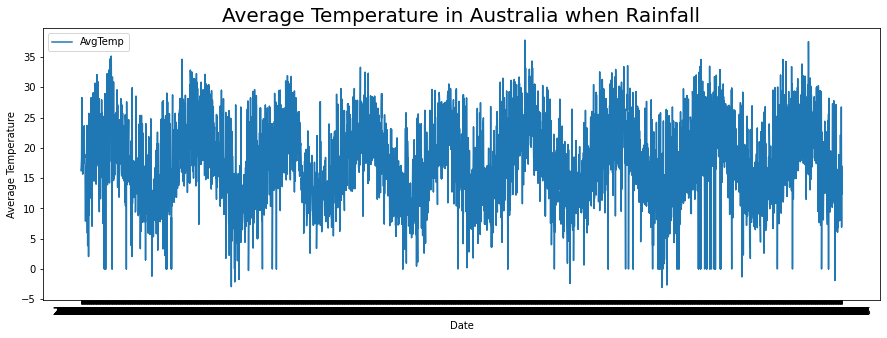

In [ ]:
#Plot Rata-Rata Temperature
plt.figure(figsize=(15,5))
plt.plot(date, avgtemp)
plt.title('Average Temperature in Australia when Rainfall', fontsize=20)
plt.ylabel('Average Temperature')
plt.xlabel('Date')
plt.legend(["AvgTemp"], loc='upper left')
plt.show()


In [ ]:
#Split dataframe
x_train, x_valid, y_train, y_valid = train_test_split(avgtemp, date, train_size=0.8, test_size = 0.2, shuffle = False )
print('Data Train : ',len(x_train))
print('Data Validation : ',len(x_valid))

Data Train :  9600
Data Validation :  2400


In [ ]:
#Menghitung nilai batasan <10% dari skala data
Mae = (avgtemp.max() - avgtemp.min()) * 10/100
print(Mae)

4.08


In [ ]:
def windowed_dataset(series, window_size, batch_size, shuffle_buffer):
  series = tf.expand_dims(series, axis=-1)
  ds = tf.data.Dataset.from_tensor_slices(series)
  ds = ds.window(window_size + 1, shift=1, drop_remainder = True)
  ds = ds.flat_map(lambda w: w.batch(window_size + 1))
  ds = ds.shuffle(shuffle_buffer)
  ds = ds.map(lambda w: (w[:-1], w[-1:]))
  return ds.batch(batch_size).prefetch(1)

In [ ]:
#mengatur train set dan validation set
train_set = windowed_dataset(x_train, window_size=64, batch_size=100, shuffle_buffer=1000)
val_set = windowed_dataset(x_valid, window_size=64, batch_size=100, shuffle_buffer=1000)

In [ ]:
#membuat fungsi callback
class myCallback(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    if(logs.get('mae')<4.08 and logs.get('val_mae')<4.08):
      print("\nMAE dari model < 10%")
      self.model.stop_training = True
callbacks = myCallback()

In [ ]:
#model 
model = tf.keras.models.Sequential([
      tf.keras.layers.LSTM(64, return_sequences=True),
      tf.keras.layers.LSTM(64),
      tf.keras.layers.Dense(30, activation='relu'),
      tf.keras.layers.Dense(10, activation='relu'),
      tf.keras.layers.Dense(1)

])

Epoch 1/100
96/96 [==============================] - 17s 140ms/step - loss: 15.9392 - mae: 16.4382 - val_loss: 16.1185 - val_mae: 16.6178
Epoch 2/100
96/96 [==============================] - 13s 133ms/step - loss: 13.6528 - mae: 14.1515 - val_loss: 12.3661 - val_mae: 12.8660
Epoch 3/100
96/96 [==============================] - 13s 136ms/step - loss: 7.2389 - mae: 7.7250 - val_loss: 5.0839 - val_mae: 5.5665
Epoch 4/100
96/96 [==============================] - 13s 136ms/step - loss: 4.3019 - mae: 4.7793 - val_loss: 4.5176 - val_mae: 4.9899
Epoch 5/100
96/96 [==============================] - 13s 135ms/step - loss: 3.6041 - mae: 4.0765 - val_loss: 3.7960 - val_mae: 4.2646
Epoch 6/100
96/96 [==============================] - 13s 135ms/step - loss: 3.2729 - mae: 3.7408 - val_loss: 3.7747 - val_mae: 4.2439
Epoch 7/100
96/96 [==============================] - 13s 134ms/step - loss: 3.2176 - mae: 3.6836 - val_loss: 3.6837 - val_mae: 4.1548
Epoch 8/100
96/96 [==============================] - 1

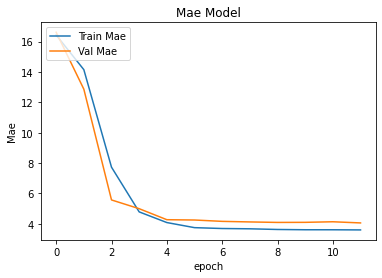

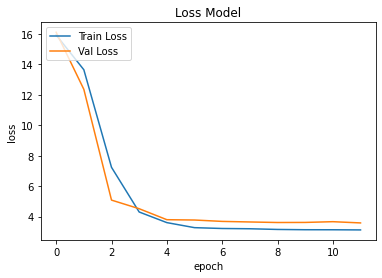

In [ ]:
optimizer = tf.keras.optimizers.SGD(learning_rate=1.0000e-04, momentum=0.9)
model.compile(loss=tf.keras.losses.Huber(),
              optimizer=optimizer,
              metrics=["mae"])
history = model.fit(train_set,
                    epochs=100,
                    batch_size=100,
                    validation_data = val_set,
                    callbacks=[callbacks]
                    )
#plot mae
plt.plot(history.history['mae'])
plt.plot(history.history['val_mae'])
plt.title('Mae Model')
plt.ylabel('Mae')
plt.xlabel('epoch')
plt.legend(['Train Mae', 'Val Mae'], loc='upper left')
plt.show()

#plot loss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Loss Model')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['Train Loss', 'Val Loss'], loc='upper left')
plt.show()